In [2]:
import cv2
import os
import matplotlib.pyplot as plt
import numpy as np

In [6]:
def load_images_from_folder(folder):
    images = []
    for filename in os.listdir(folder):
        img = cv2.imread(os.path.join(folder,filename))
        if img is not None:
            img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
            img = cv2.resize(img, (512, 512))
            images.append(img)
    return images

In [9]:
images = load_images_from_folder("../data/hyper-kvasir-dataset-vanilla/dyed-lifted-polyps")

print(images.__len__())

1002


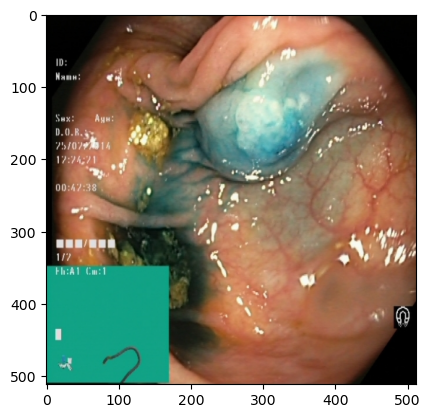

In [6]:
plt.imshow(images[0])

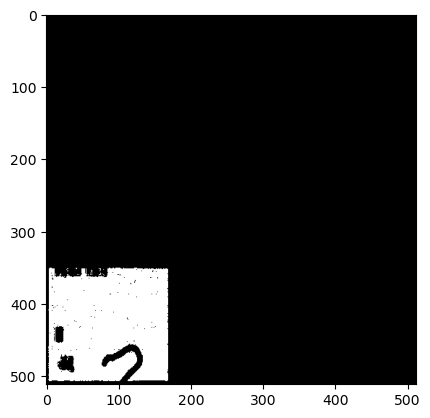

In [7]:
# Create a function to eliminate green patches from images if the image contain a green patches
# Create a function to detect green patches

def detect_green_patches(image):
    green_mark_pixel = image[450, 50, :]
    if green_mark_pixel[1] > 150:
        return True
    else:
        return False


def eliminate_green_patches_v2(image):

    new_image = image.copy()

    if detect_green_patches(image):
        mask_1 = np.zeros(image.shape, np.uint8)
        mask_2 = np.zeros(image.shape, np.uint8)
        mask_3 = np.zeros(image.shape, np.uint8)

        mask_1 = new_image[:, :, 1] > 160
        mask_2 = new_image[:, :, 2] > 130
        mask_3 = new_image[:, :, 0] < 60

        mask = mask_1 & mask_2 & mask_3

        rect = cv2.rectangle(np.zeros(image.shape, np.uint8), (0, 0), (0, 0), (255, 255, 255), -1)

        for i in range(rect.shape[0]):
            for j in range(rect.shape[1]):
                if mask[i, j]:
                    rect[i, j] = 255

        return rect

    return new_image

rect = eliminate_green_patches_v2(images[0])
plt.imshow(rect)

Number of contours: 104
x: 3, y: 351, w: 166, h: 157


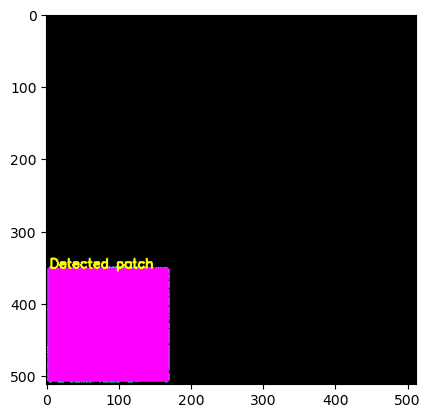

In [10]:
# Find a square green contour in the image

img = rect.copy()

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
ret,thresh = cv2.threshold(gray,50,255,0)
contours, _ = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

print(f"Number of contours: {len(contours)}")

for cnt in contours:
   x1,y1 = cnt[0][0]
   approx = cv2.approxPolyDP(cnt, 0.01*cv2.arcLength(cnt, True), True)
   x, y, w, h = cv2.boundingRect(cnt)

   # Min size of the path
   if w >= 100 and h >= 100:
     img = cv2.drawContours(img, [cnt], -1, (0,255,255), 3)
     # Fill the entire contour
     img = cv2.fillPoly(img, pts =[cnt], color=(0,255,255))

     print(f"x: {x}, y: {y}, w: {w}, h: {h}")

    # Create a cv2.rectangle and fill it entire


     img = cv2.rectangle(img, (x, y), (x + w, y + h), (255, 0, 255), -1)

     cv2.putText(img, 'Detected patch', (x1, y1), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 0), 2)

plt.imshow(img)

Number of contours: 104


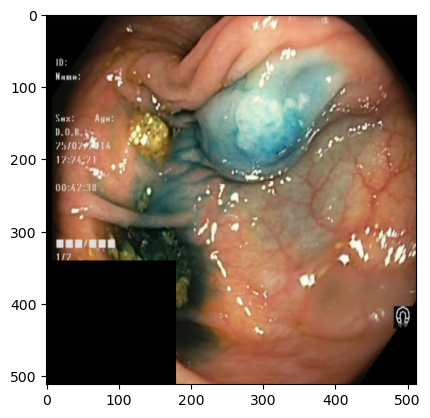

In [11]:
# Find a square green contour in the image

epsilon = 10

img = rect.copy()

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
ret,thresh = cv2.threshold(gray,50,255,0)
contours, _ = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

print(f"Number of contours: {len(contours)}")

for cnt in contours:
   x1,y1 = cnt[0][0]
   approx = cv2.approxPolyDP(cnt, 0.01*cv2.arcLength(cnt, True), True)
   x, y, w, h = cv2.boundingRect(cnt)

   # Min size of the path
   if w >= 100 and h >= 100:
     mask = cv2.drawContours(img, [cnt], -1, (255,255,255), 3)
     # Fill the entire contour
     mask = cv2.fillPoly(img, pts =[cnt], color=(255,255,255))

     # Filling the entire green patch to delete
     mask = cv2.rectangle(img, (x - epsilon, y - epsilon), (x + w + epsilon, y + h + epsilon), (255, 255, 255), -1)

     new_image = images[0].copy()

     # We want to eliminate the green patch
     mask = cv2.bitwise_not(mask)
     new_image = cv2.bitwise_and(new_image, mask)

plt.imshow(new_image)

In [7]:
def detect_green_patches(image: np.ndarray, threshold: float = 130.0) -> bool:
    green_mark_pixel = image[450, 50, :]

    return green_mark_pixel[1] > threshold


def delete_green_patches(image: np.ndarray, threshold: float = 130.0, epsilon: int = 10) -> None:
    new_image = image.copy()

    if not detect_green_patches(image, threshold=threshold):
        return new_image

    # Creating a mask for each channel
    mask_1 = np.zeros(image.shape, np.uint8)
    mask_2 = np.zeros(image.shape, np.uint8)
    mask_3 = np.zeros(image.shape, np.uint8)

    mask_1 = new_image[:, :, 1] > 160
    mask_2 = new_image[:, :, 2] > 130
    mask_3 = new_image[:, :, 0] < 30

    mask = mask_1 & mask_2 & mask_3
    rect = cv2.rectangle(np.zeros(image.shape, np.uint8), (0, 0), (0, 0), (255, 255, 255), -1)

    for i in range(rect.shape[0]):
        for j in range(rect.shape[1]):
            if mask[i, j]:
                rect[i, j] = 255

    img = rect.copy()

    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    ret, thresh = cv2.threshold(gray, 50, 255, 0)
    contours, _ = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

    print(f"Number of contours: {len(contours)}")

    for cnt in contours:
        x1, y1 = cnt[0][0]
        approx = cv2.approxPolyDP(cnt, 0.01 * cv2.arcLength(cnt, True), True)
        x, y, w, h = cv2.boundingRect(cnt)

        # Min size of the path
        if w >= 50 and h >= 50 and x >= 0 and x <= 250 and y >= 300:
            mask = cv2.drawContours(img, [cnt], -1, (255, 255, 255), 3)
            # Fill the entire contour
            mask = cv2.fillPoly(img, pts=[cnt], color=(255, 255, 255))

            # Filling the entire green patch to delete
            mask = cv2.rectangle(img, (x - epsilon, y - epsilon), (x + w + epsilon, y + h + epsilon), (255, 255, 255),
                                 -1)

            # We want to eliminate the green patch
            mask = cv2.bitwise_not(mask)
            new_image = cv2.bitwise_and(new_image, mask)

    return new_image

Number of contours: 221
True


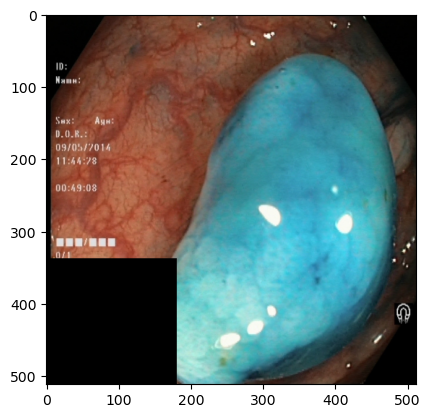

In [10]:
index = 104
new_image = delete_green_patches(images[index])
print(detect_green_patches(images[index]))
plt.imshow(new_image)

## Processing all images

It's necessary to apply the findPolygon method due to the different sizes of the green patches present in the images. As a result, it is convenient to use this method to try to remove as little information from the image as possible.

Number of contours: 87


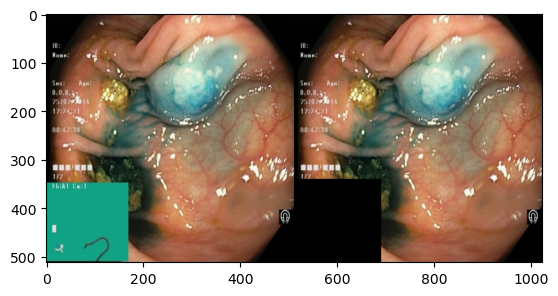

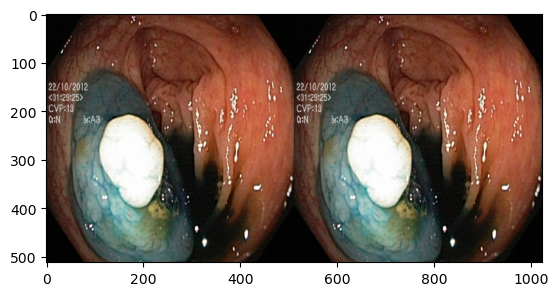

Number of contours: 101


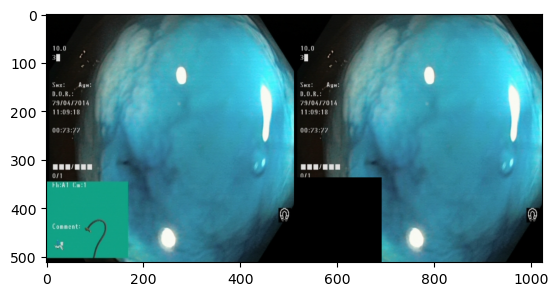

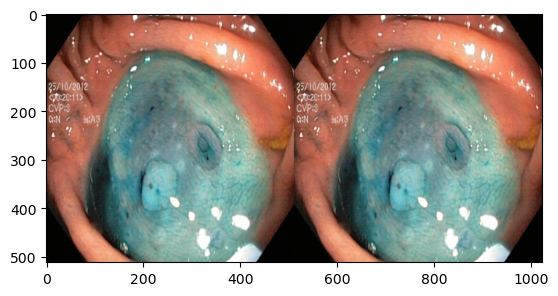

Number of contours: 1


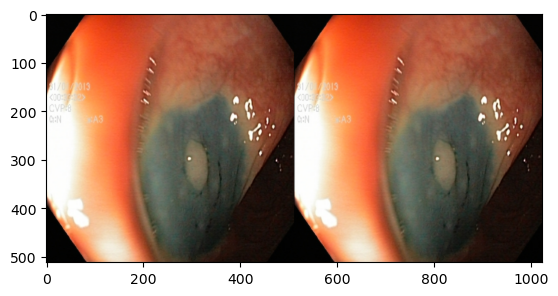

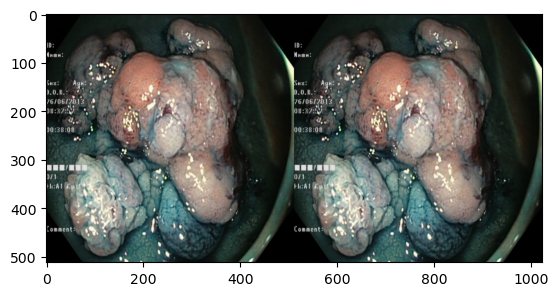

Number of contours: 29


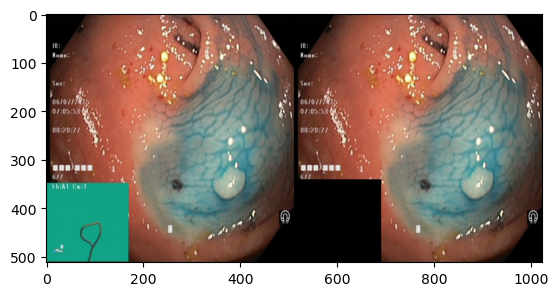

Number of contours: 296


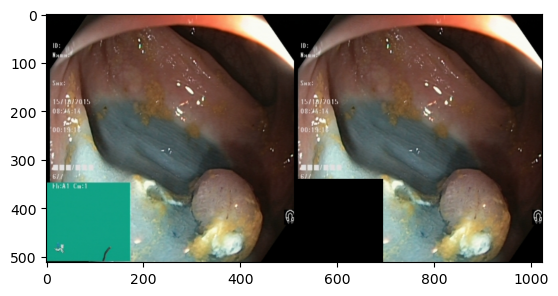

Number of contours: 269


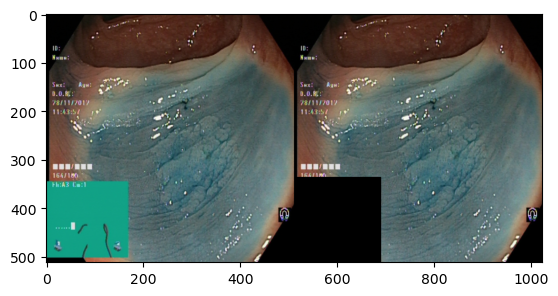

Number of contours: 193


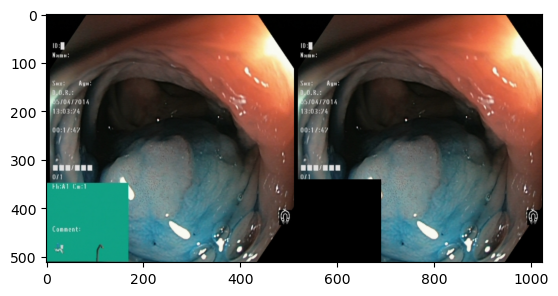

Number of contours: 112


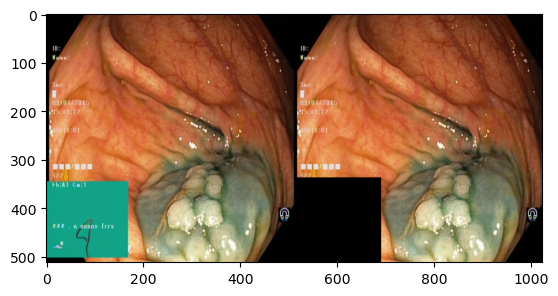

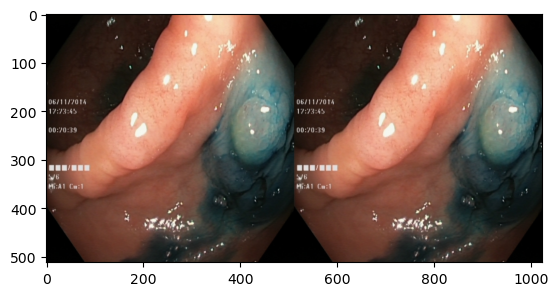

Number of contours: 94


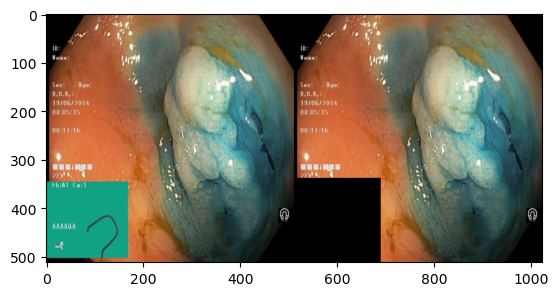

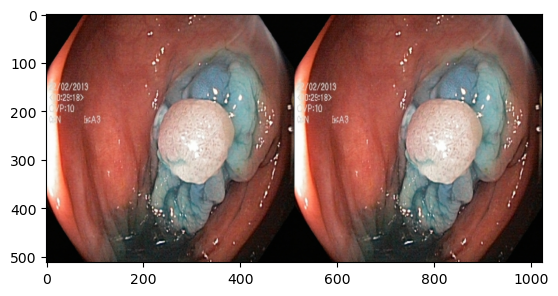

Number of contours: 66


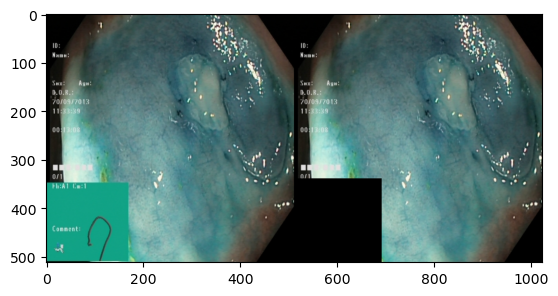

Number of contours: 249


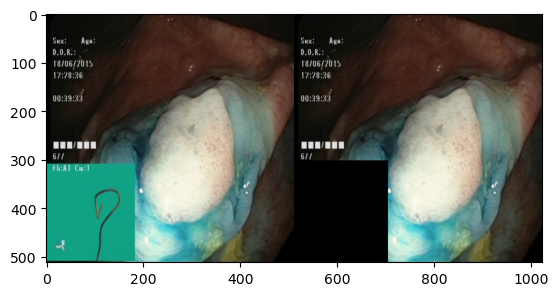

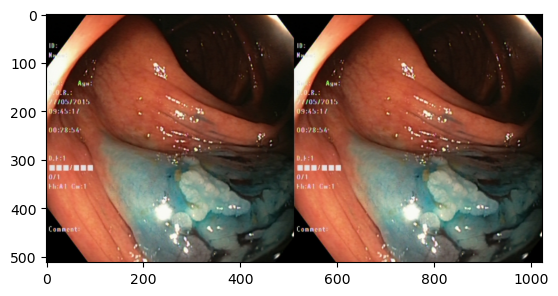

Number of contours: 8


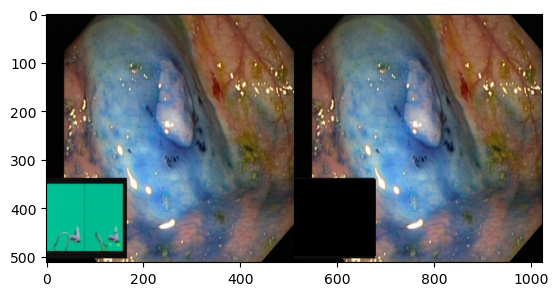

Number of contours: 37


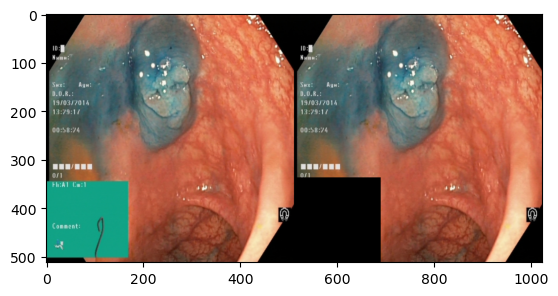

Number of contours: 1


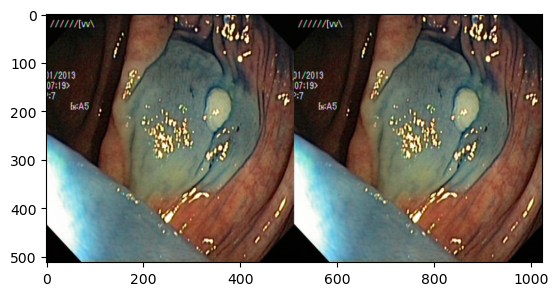

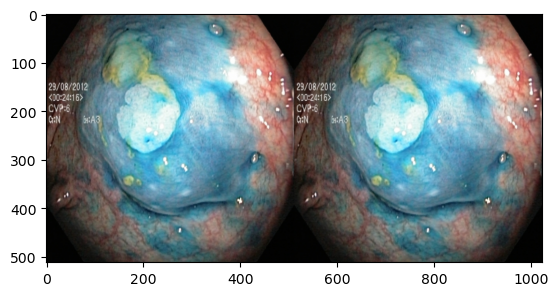

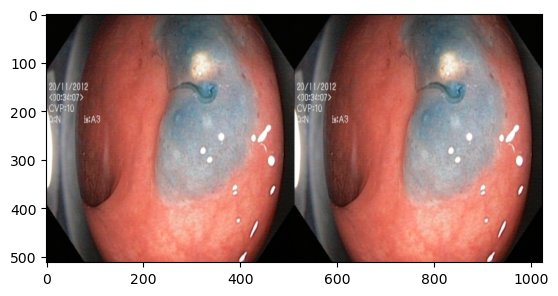

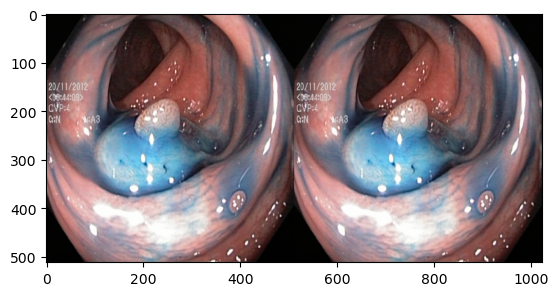

Number of contours: 95


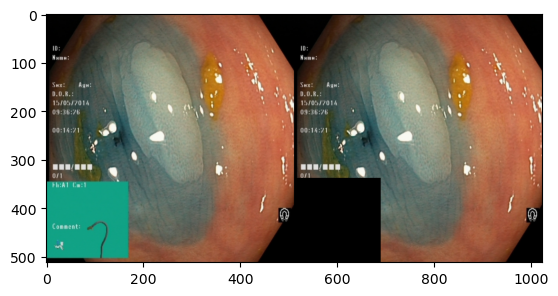

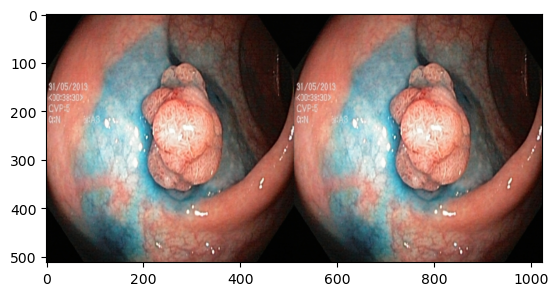

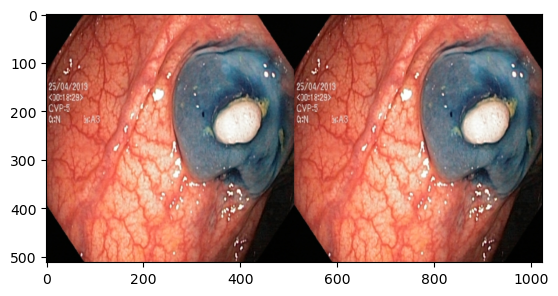

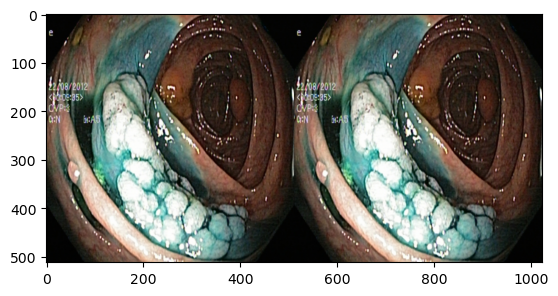

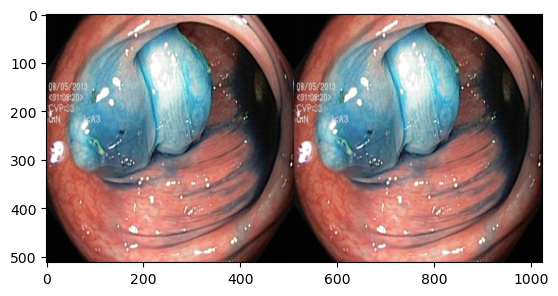

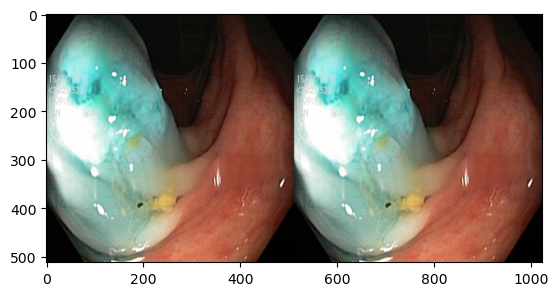

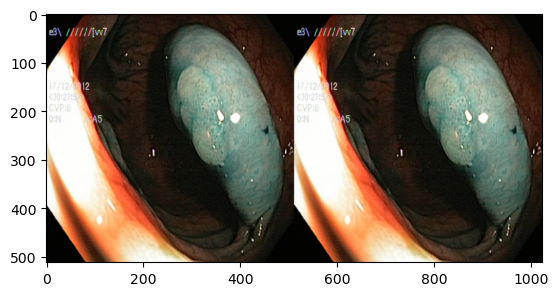

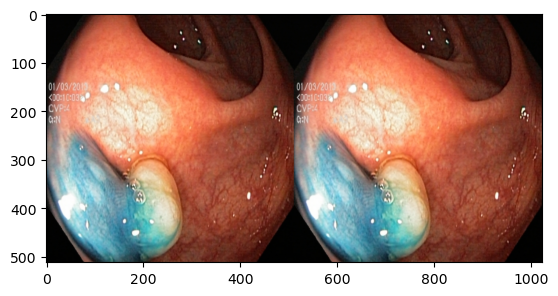

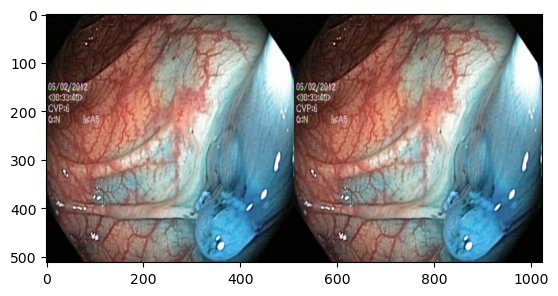

Number of contours: 1


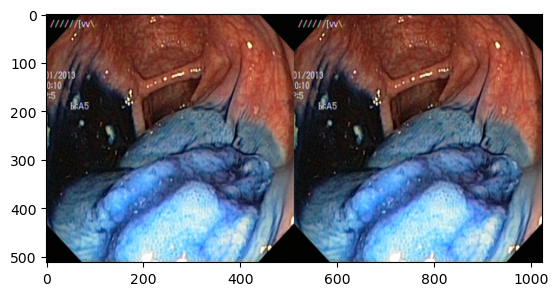

Number of contours: 8


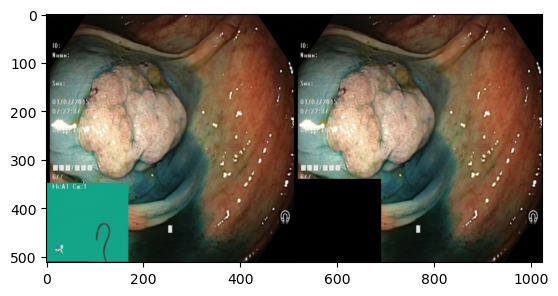

Number of contours: 28


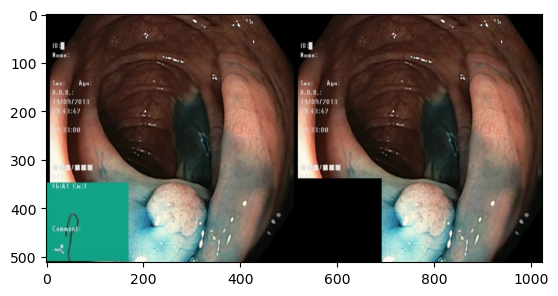

Number of contours: 19


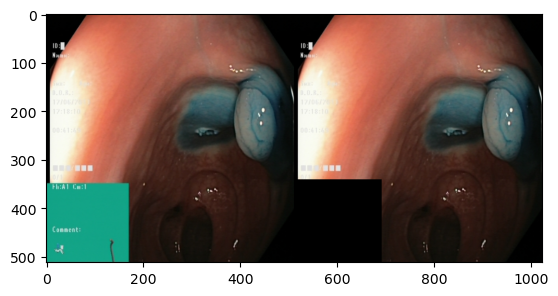

Number of contours: 1


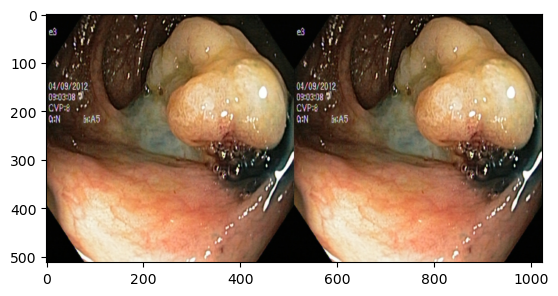

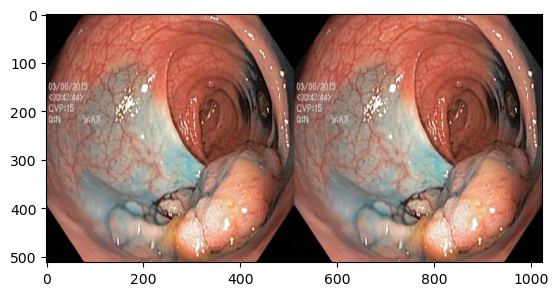

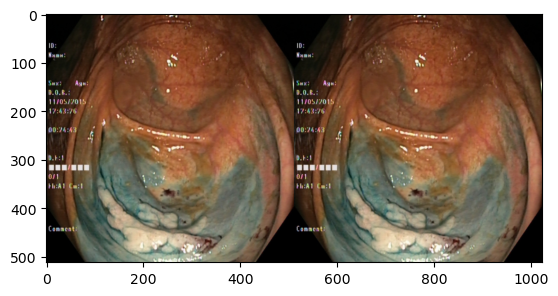

Number of contours: 76


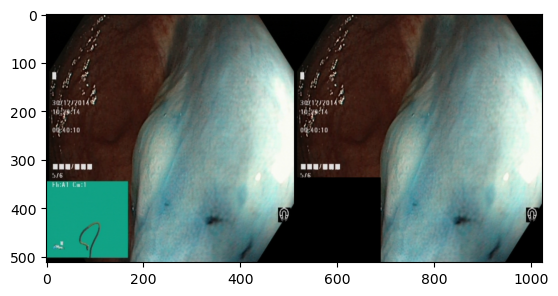

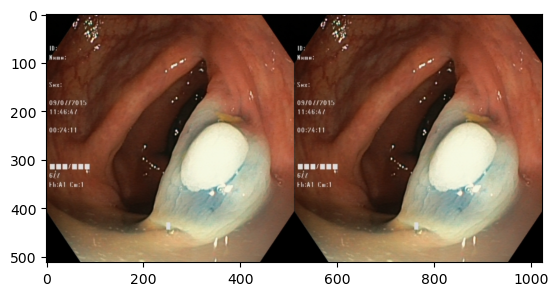

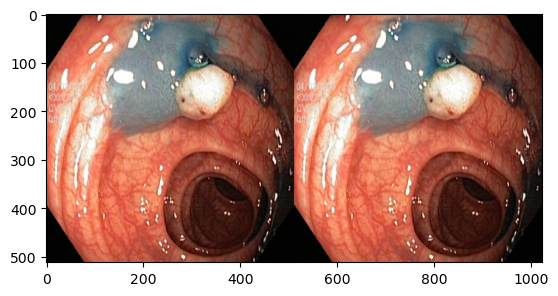

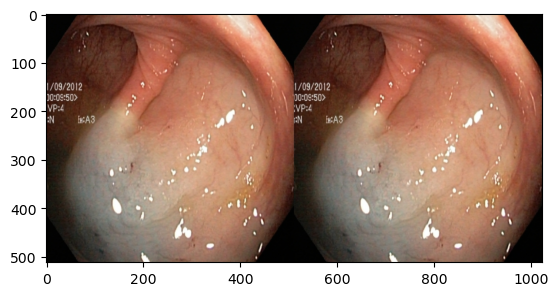

Number of contours: 120


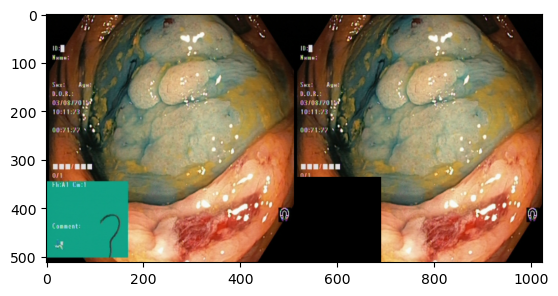

Number of contours: 13


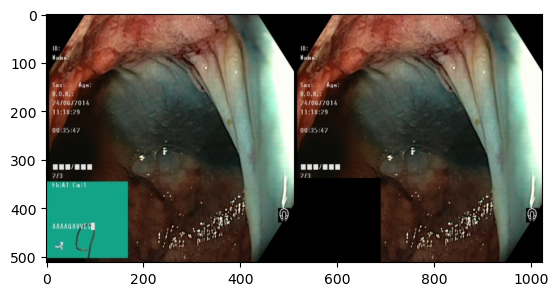

Number of contours: 48


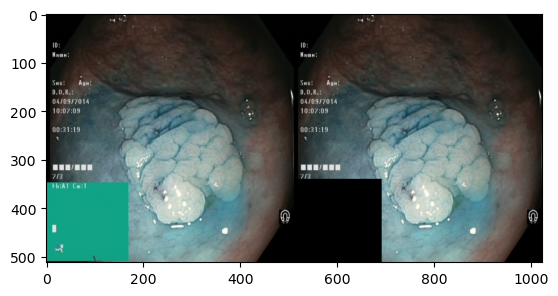

Number of contours: 98


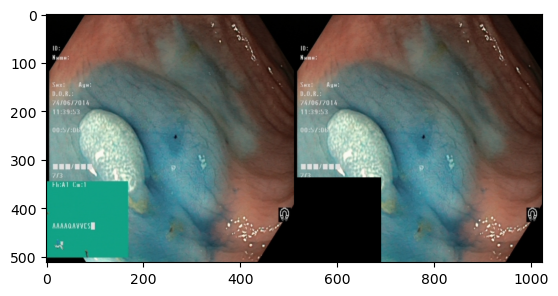

Number of contours: 15


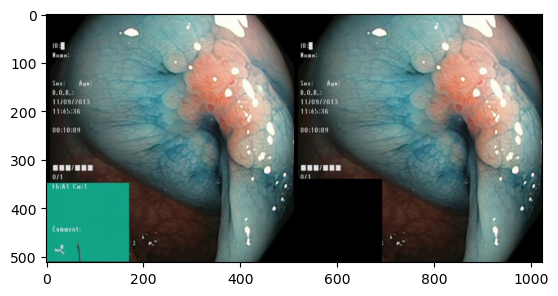

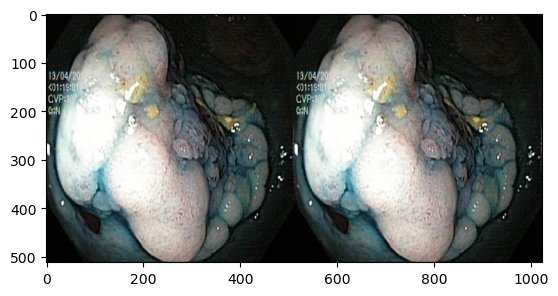

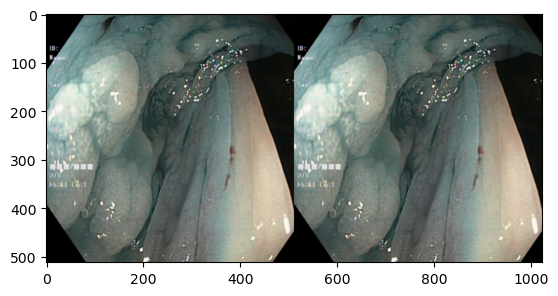

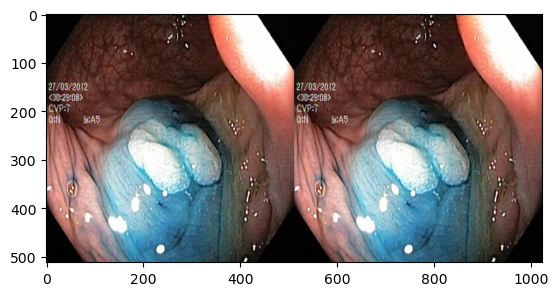

Number of contours: 633


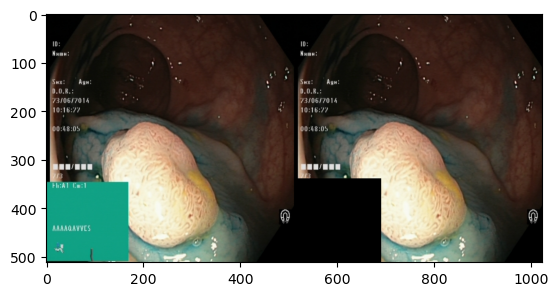

Number of contours: 51


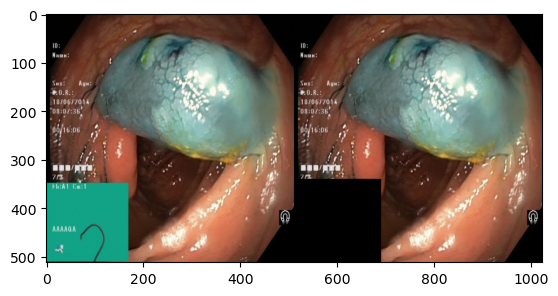

Number of contours: 39


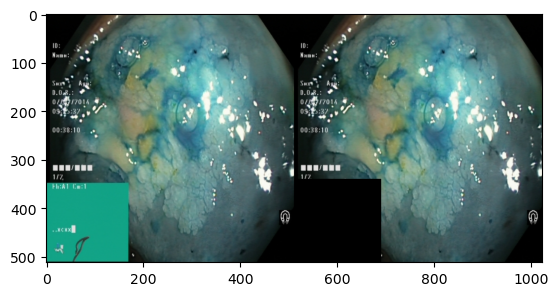

Number of contours: 3


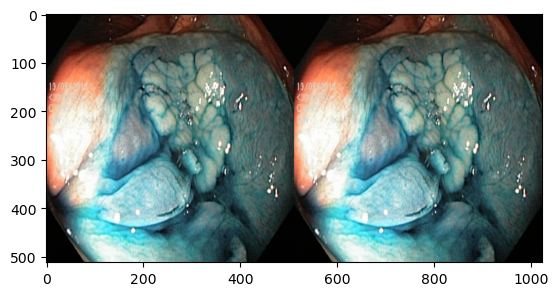

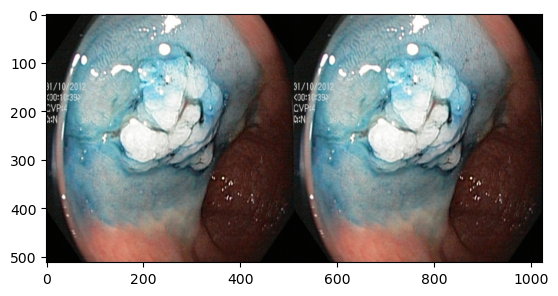

Number of contours: 11


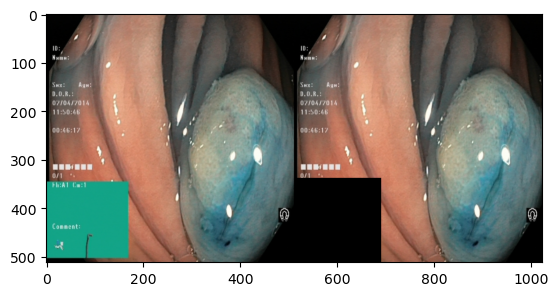

Number of contours: 15


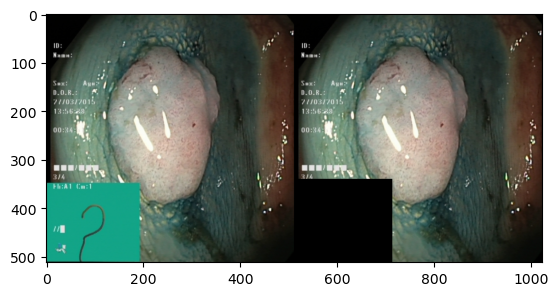

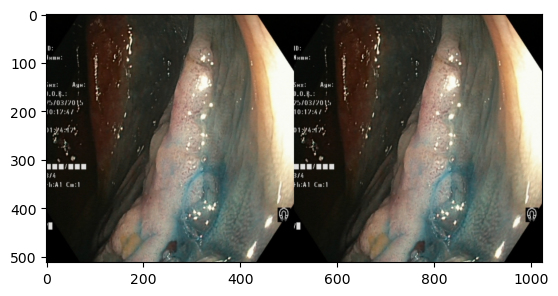

Number of contours: 545


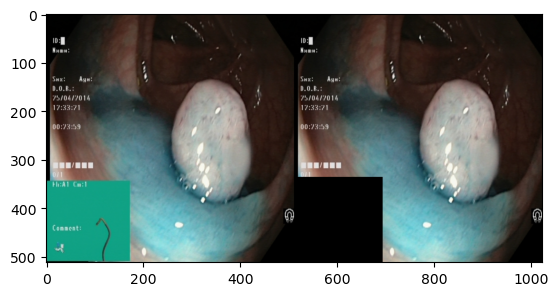

Number of contours: 603


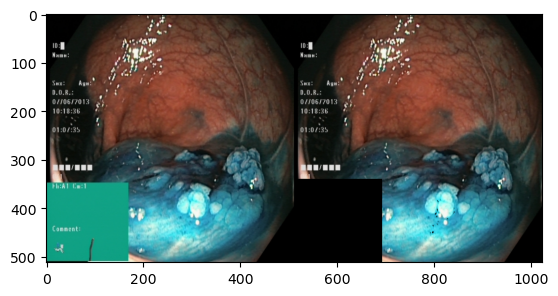

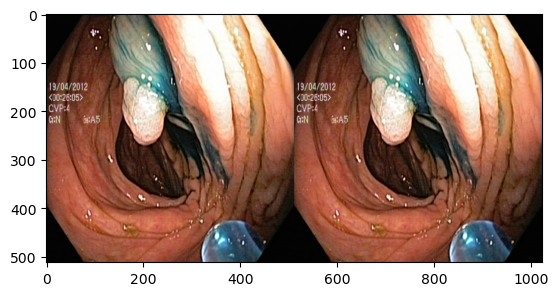

Number of contours: 53


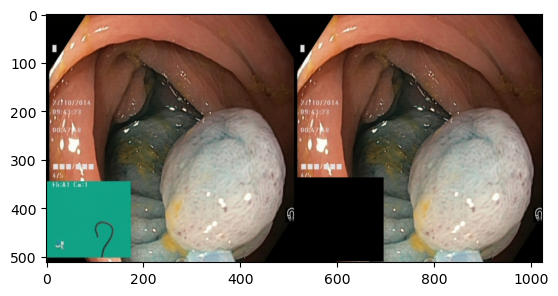

Number of contours: 106


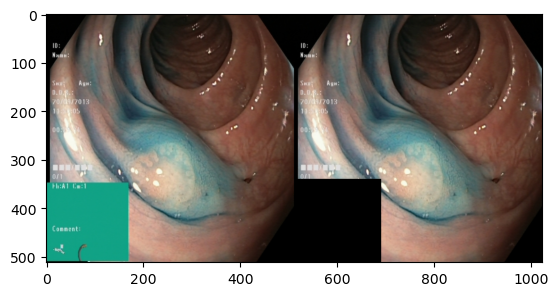

Number of contours: 341


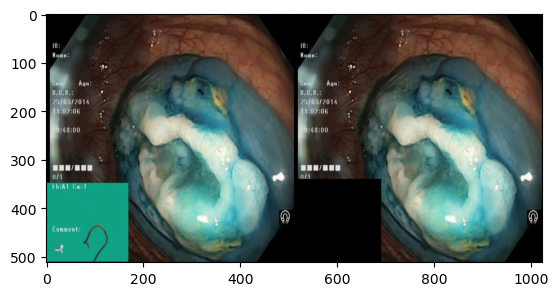

Number of contours: 29


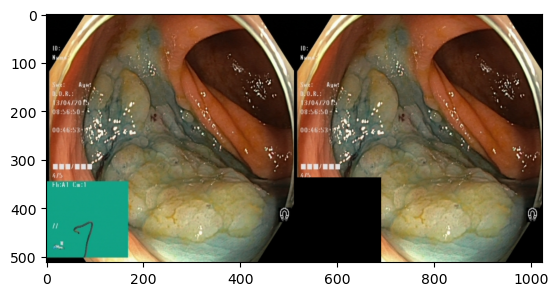

Number of contours: 451


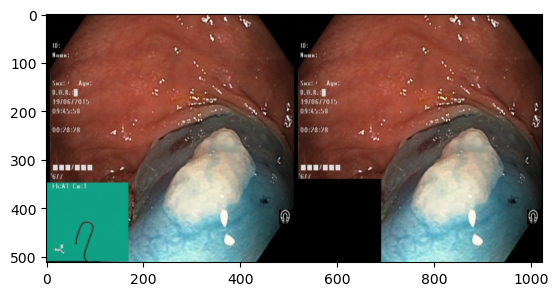

Number of contours: 16


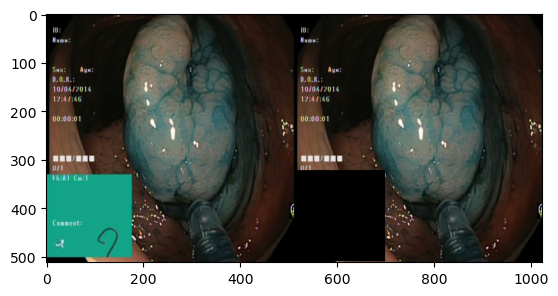

Number of contours: 11


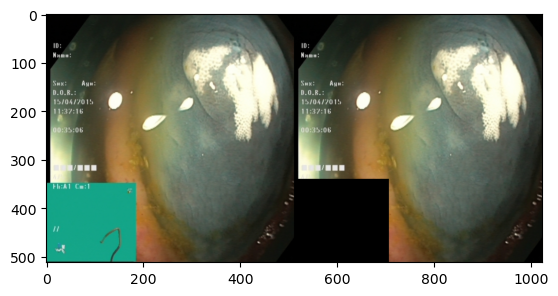

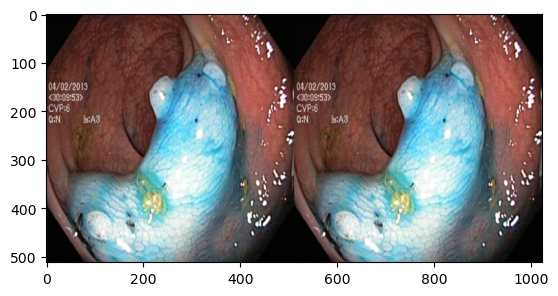

Number of contours: 755


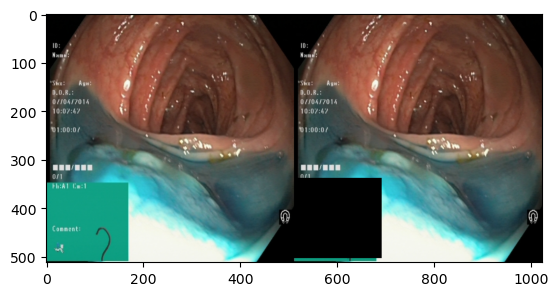

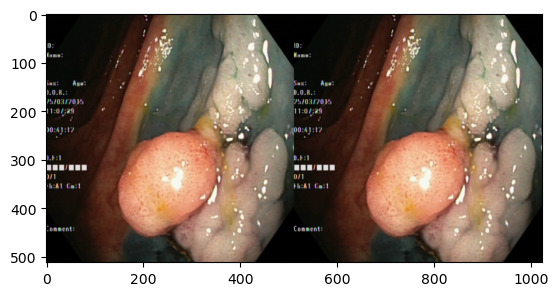

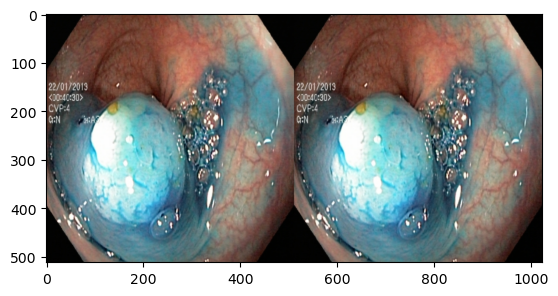

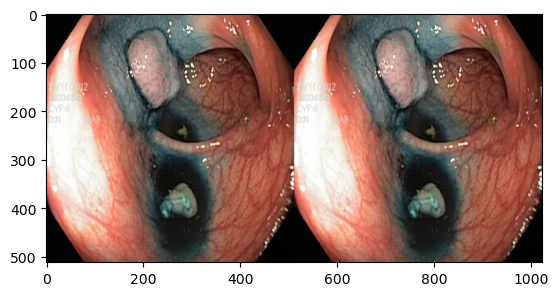

Number of contours: 89


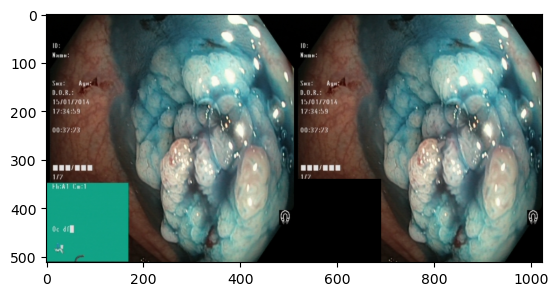

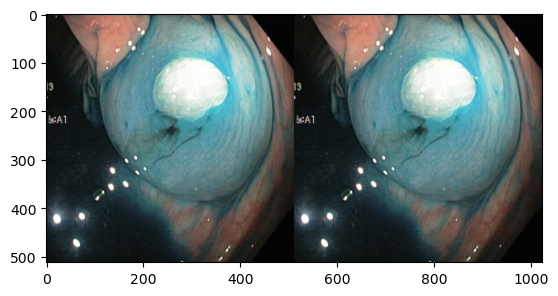

Number of contours: 83


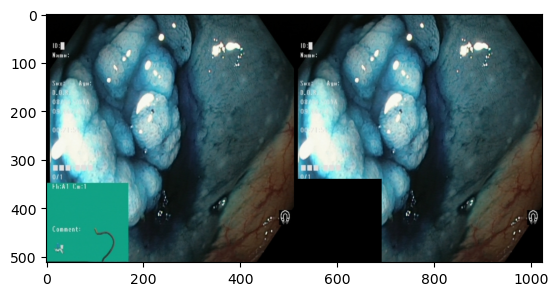

Number of contours: 52


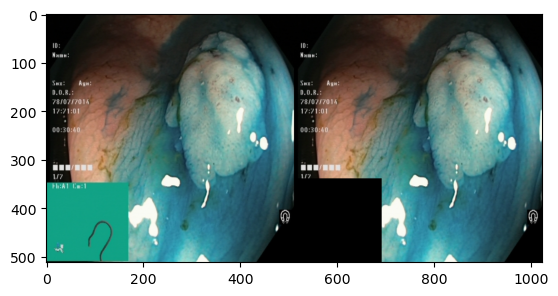

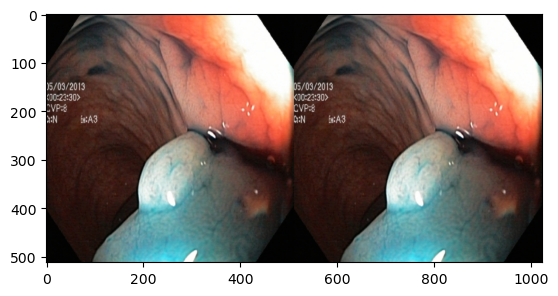

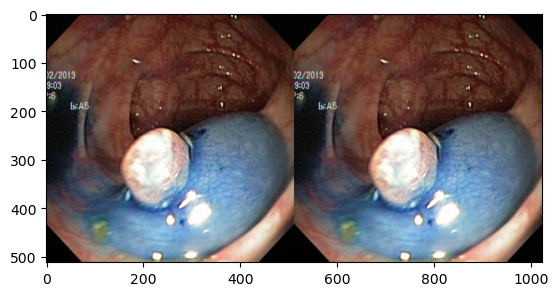

Number of contours: 84


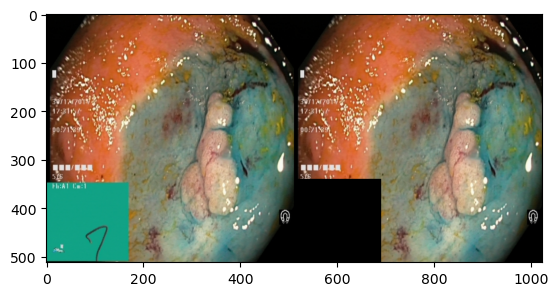

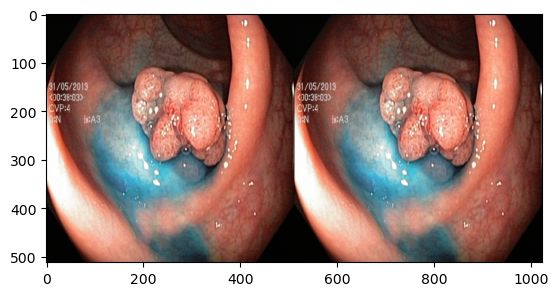

Number of contours: 49


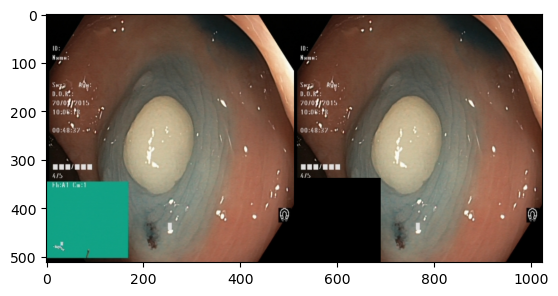

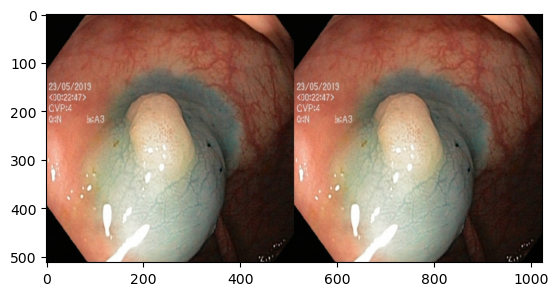

Number of contours: 48


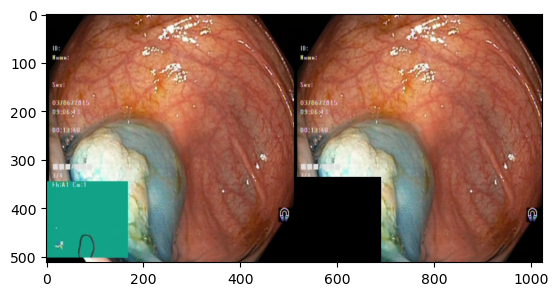

Number of contours: 420


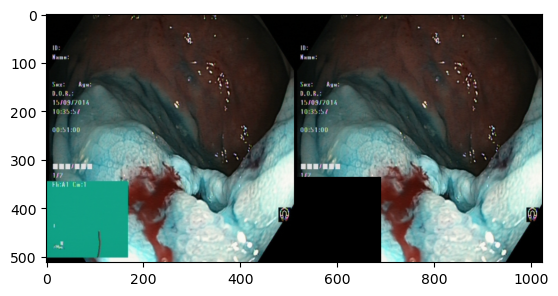

Number of contours: 23


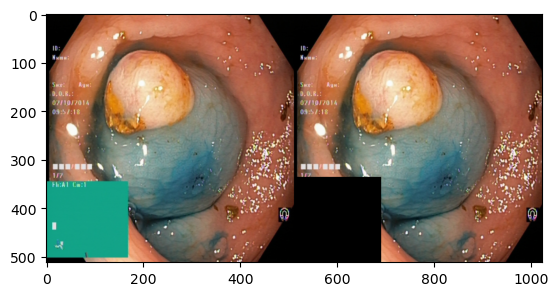

Number of contours: 1


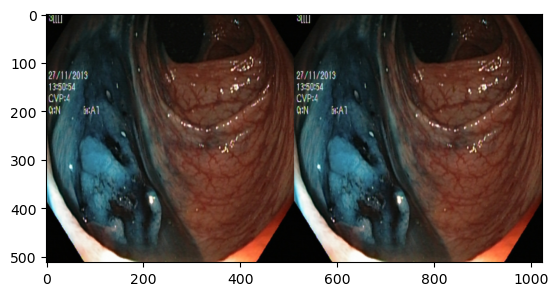

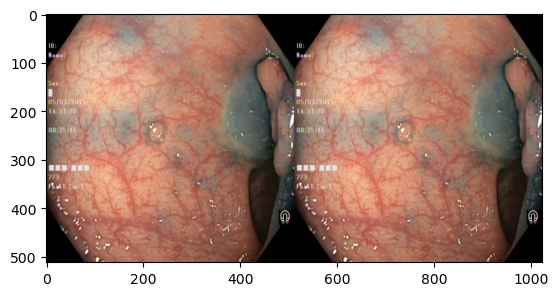

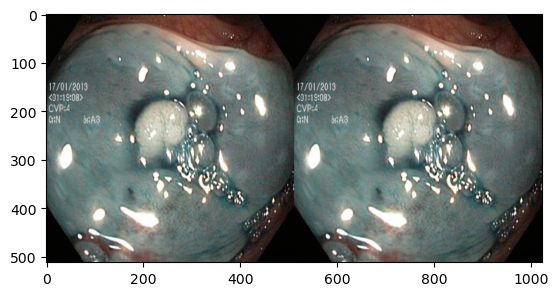

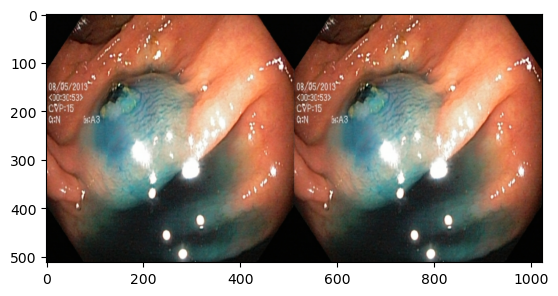

Number of contours: 185


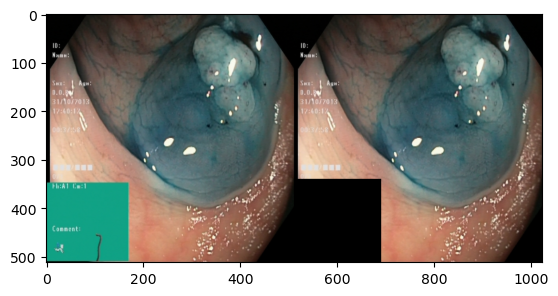

Number of contours: 57


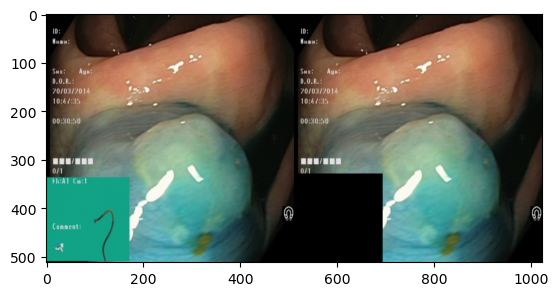

Number of contours: 170


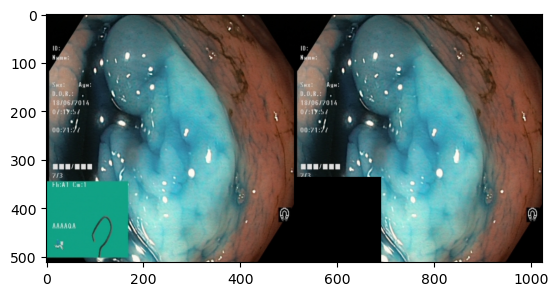

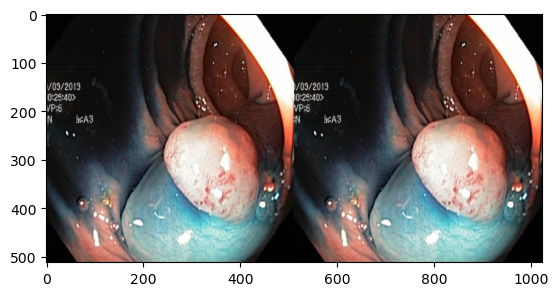

Number of contours: 198


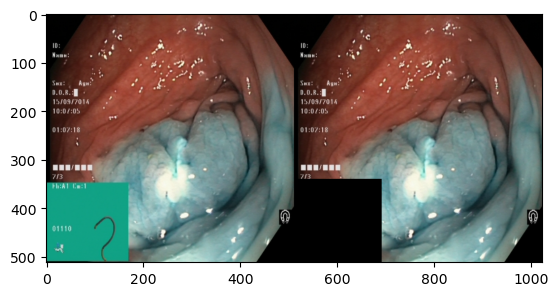

Number of contours: 148


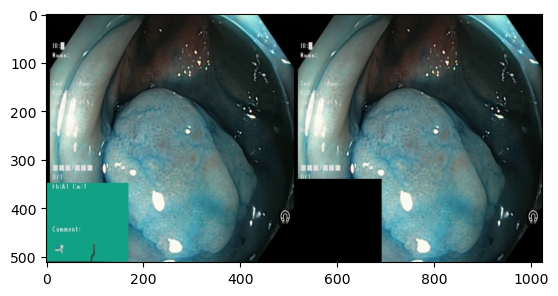

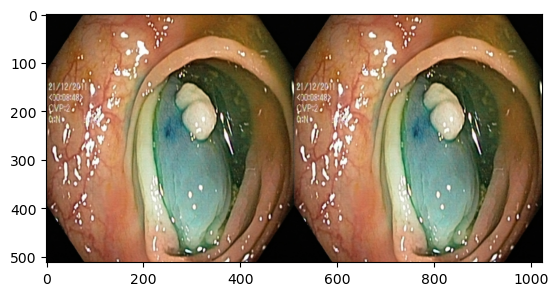

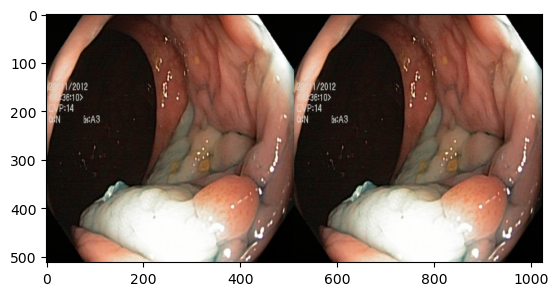

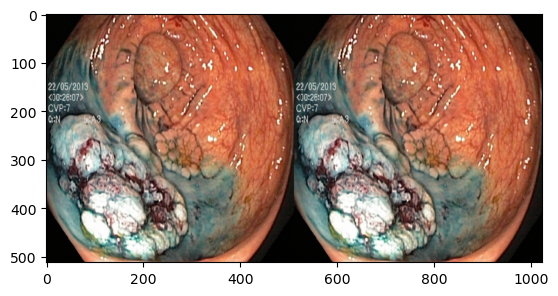

In [116]:
for index in range(100):
    new_image = delete_green_patches(images[index])

    # Put the old image to the left and the new image to the right
    new_image = np.concatenate((images[index], new_image), axis=1)
    plt.imshow(new_image)
    plt.show()

In [131]:
# Pre-process all the images deleting the green patches

# List all folder from "../data/hyper-kvasir-dataset-final", not detect the hidden folders
folders = os.listdir("../data/hyper-kvasir-dataset-final")
final_path = "../data/test"

# if the final path exists, delete it
if os.path.isdir(final_path):
   os.system("rm -rf " + final_path)

# Create the final folder
os.mkdir(final_path)

for folder in folders:
    current_path = os.path.join("../data/hyper-kvasir-dataset-final", folder)

    if os.path.isdir(current_path):
        print(f"Processing folder: {folder}")

        current_images = load_images_from_folder(current_path)

        # Do the previous for in one line
        new_current_images = [delete_green_patches(image) for image in current_images]

        # Create the folder in the final path
        os.mkdir(os.path.join(final_path, folder))

        # Save the new images in the same folders name but in the final path
        for index, new_current_image in enumerate(new_current_images):
            new_current_image = cv2.cvtColor(new_current_image, cv2.COLOR_BGR2RGB)
            cv2.imwrite(os.path.join(final_path, folder, f"{index + 1}.jpg"), new_current_image)


    else:
        print(f"Folder {folder} is not a directory")

    #current_class_images = load_images_from_folder(folder)

Processing folder: polyps
Number of contours: 1
Number of contours: 1
Number of contours: 1
Number of contours: 37
Number of contours: 1
Number of contours: 1
Number of contours: 1
Number of contours: 1
Number of contours: 1
Number of contours: 1
Number of contours: 1
Number of contours: 104
Number of contours: 1
Number of contours: 1
Number of contours: 1
Number of contours: 36
Number of contours: 1
Number of contours: 11
Number of contours: 249
Number of contours: 1
Number of contours: 1
Number of contours: 1
Number of contours: 1
Number of contours: 1
Number of contours: 12
Number of contours: 1
Number of contours: 1
Number of contours: 1
Number of contours: 1
Number of contours: 1
Number of contours: 33
Number of contours: 38
Number of contours: 50
Number of contours: 1
Number of contours: 1
Number of contours: 1
Number of contours: 34
Number of contours: 225
Number of contours: 1
Number of contours: 1
Number of contours: 1
Number of contours: 44
Number of contours: 1
Number of con

# Fusion green patches and non green patches dataset

In [11]:
# Pre-process all the images deleting the green patches

# List all folder from "../data/hyper-kvasir-dataset-final", not detect the hidden folders
folders = os.listdir("../data/hyper-kvasir-dataset-vanilla")
final_path = "../data/hyper-kvasir-dataset-fusion"

# if the final path exists, delete it
if os.path.isdir(final_path):
   os.system("rm -rf " + final_path)

# Create the final folder
os.mkdir(final_path)

for folder in folders:
    current_path = os.path.join("../data/hyper-kvasir-dataset-vanilla", folder)

    if os.path.isdir(current_path):
        print(f"Processing folder: {folder}")

        current_images = load_images_from_folder(current_path)

        # Do the previous for in one line
        new_current_images = [delete_green_patches(image) for image in current_images]

        # Create the folder in the final path
        os.mkdir(os.path.join(final_path, folder))

        # Save the new images in the same folders name but in the final path
        for index, new_current_image in enumerate(new_current_images):
            new_current_image = cv2.cvtColor(new_current_image, cv2.COLOR_BGR2RGB)
            old_current_image = cv2.cvtColor(current_images[index], cv2.COLOR_BGR2RGB)

            # Non green patch
            cv2.imwrite(os.path.join(final_path, folder, f"{index + 1}_a.jpg"), new_current_image)

            # Green patch
            cv2.imwrite(os.path.join(final_path, folder, f"{index + 1}_b.jpg"), old_current_image)


    else:
        print(f"Folder {folder} is not a directory")

    #current_class_images = load_images_from_folder(folder)

Processing folder: polyps
Number of contours: 1
Number of contours: 1
Number of contours: 1
Number of contours: 37
Number of contours: 1
Number of contours: 1
Number of contours: 1
Number of contours: 1
Number of contours: 1
Number of contours: 1
Number of contours: 1
Number of contours: 104
Number of contours: 1
Number of contours: 1
Number of contours: 1
Number of contours: 36
Number of contours: 1
Number of contours: 11
Number of contours: 254
Number of contours: 1
Number of contours: 1
Number of contours: 1
Number of contours: 1
Number of contours: 1
Number of contours: 18
Number of contours: 1
Number of contours: 1
Number of contours: 1
Number of contours: 1
Number of contours: 33
Number of contours: 38
Number of contours: 50
Number of contours: 1
Number of contours: 1
Number of contours: 1
Number of contours: 62
Number of contours: 225
Number of contours: 1
Number of contours: 1
Number of contours: 1
Number of contours: 44
Number of contours: 1
Number of contours: 1
Number of con

In [12]:
# Count the number of images in the final folder
folders = os.listdir("../data/hyper-kvasir-dataset-fusion")
count = 0

for folder in folders:
    current_path = os.path.join("../data/hyper-kvasir-dataset-fusion", folder)

    if os.path.isdir(current_path):
        print(f"Processing folder: {folder}")

        current_images = load_images_from_folder(current_path)
        count += len(current_images)

print(f"Total images: {count}")

Processing folder: polyps
Processing folder: barretts-short-segment
Processing folder: impacted-stool
Processing folder: dyed-lifted-polyps
Processing folder: ulcerative-colitis-grade-2
Processing folder: barretts
Processing folder: ulcerative-colitis-grade-3
Processing folder: retroflex-stomach
Processing folder: bbps-0-1
Processing folder: pylorus
Processing folder: bbps-2-3
Processing folder: ileum
Processing folder: hemorrhoids
Processing folder: esophagitis-a
Processing folder: cecum
Processing folder: ulcerative-colitis-grade-0-1
Processing folder: dyed-resection-margins
Processing folder: ulcerative-colitis-grade-2-3
Processing folder: z-line
Processing folder: retroflex-rectum
Processing folder: ulcerative-colitis-grade-1
Processing folder: esophagitis-b-d
Processing folder: ulcerative-colitis-grade-1-2
Total images: 21324
